In [1]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px


from sklearn.tree import DecisionTreeClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.svm import SVC, LinearSVC
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis , QuadraticDiscriminantAnalysis
from sklearn.linear_model import LinearRegression,Ridge,Lasso,RidgeCV, ElasticNet
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor, AdaBoostRegressor, RandomForestClassifier
from sklearn.svm import SVR
from sklearn.neighbors import KNeighborsRegressor
from sklearn.neural_network import MLPRegressor
from sklearn.model_selection import train_test_split
from sklearn.feature_selection import RFECV
from sklearn.model_selection import GridSearchCV , KFold , cross_val_score
from sklearn.preprocessing import MinMaxScaler , StandardScaler, LabelEncoder
from sklearn.metrics import mean_squared_log_error, mean_squared_error, r2_score,mean_absolute_error
from sklearn.metrics import accuracy_score, precision_score, recall_score,f1_score  


In [2]:
Data = pd.read_csv('train.csv')
Data.head()

,Id,carat,cut,color,clarity,depth,table,price,x,y,z
0,1,1.06,Ideal,I,SI2,61.8,57.0,4270,6.57,6.60,4.07
1,2,1.51,Premium,G,VVS2,60.9,58.0,15164,7.38,7.42,4.51
2,3,0.32,Ideal,F,VS2,61.3,56.0,828,4.43,4.41,2.71
3,4,0.53,Ideal,G,VS2,61.2,56.0,1577,5.19,5.22,3.19
4,5,0.70,Premium,H,VVS2,61.0,57.0,2596,5.76,5.72,3.50


In [3]:
testData = pd.read_csv('test.csv')
testData.head()

,Id,carat,cut,color,clarity,depth,table,x,y,z
0,1,0.34,Ideal,G,VVS2,61.1,57.0,4.52,4.48,2.75
1,2,0.71,Premium,E,VS2,62.7,58.0,5.74,5.68,3.58
2,3,0.44,Very Good,I,VS1,62.8,56.0,4.83,4.88,3.05
3,4,0.81,Premium,E,SI2,60.1,59.0,6.09,6.03,3.65
4,5,0.40,Ideal,G,VVS1,61.2,56.0,4.74,4.80,2.92


In [4]:
Data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 43152 entries, 0 to 43151
Data columns (total 11 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   Id       43152 non-null  int64  
 1   carat    43152 non-null  float64
 2   cut      43152 non-null  object 
 3   color    43152 non-null  object 
 4   clarity  43152 non-null  object 
 5   depth    43152 non-null  float64
 6   table    43152 non-null  float64
 7   price    43152 non-null  int64  
 8   x        43152 non-null  float64
 9   y        43152 non-null  float64
 10  z        43152 non-null  float64
dtypes: float64(6), int64(2), object(3)
memory usage: 3.6+ MB


In [5]:
Data.describe()

,Id,carat,depth,table,price,x,y,z
count,43152.000000,43152.000000,43152.000000,43152.000000,43152.000000,43152.000000,43152.000000,43152.000000
mean,21576.500000,0.797855,61.747177,57.458347,3929.491912,5.731568,5.735018,3.538568
std,12457.053745,0.473594,1.435454,2.233904,3985.527795,1.121279,1.148809,0.708238
min,1.000000,0.200000,43.000000,43.000000,326.000000,0.000000,0.000000,0.000000
25%,10788.750000,0.400000,61.000000,56.000000,947.750000,4.710000,4.720000,2.910000
50%,21576.500000,0.700000,61.800000,57.000000,2401.000000,5.700000,5.710000,3.530000
75%,32364.250000,1.040000,62.500000,59.000000,5312.000000,6.540000,6.540000,4.040000
max,43152.000000,5.010000,79.000000,95.000000,18823.000000,10.740000,58.900000,31.800000


In [6]:
# Price is int64, converting to float64
Data["price"] = Data["price"].astype(float)
Data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 43152 entries, 0 to 43151
Data columns (total 11 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   Id       43152 non-null  int64  
 1   carat    43152 non-null  float64
 2   cut      43152 non-null  object 
 3   color    43152 non-null  object 
 4   clarity  43152 non-null  object 
 5   depth    43152 non-null  float64
 6   table    43152 non-null  float64
 7   price    43152 non-null  float64
 8   x        43152 non-null  float64
 9   y        43152 non-null  float64
 10  z        43152 non-null  float64
dtypes: float64(7), int64(1), object(3)
memory usage: 3.6+ MB


In [7]:
Data.duplicated().sum()

0

In [8]:
Data["cut"].value_counts()

Ideal        17203
Premium      11113
Very Good     9658
Good          3881
Fair          1297
Name: cut, dtype: int64

In [9]:
Data["color"].value_counts()

G    9060
E    7832
F    7633
H    6651
D    5421
I    4265
J    2290
Name: color, dtype: int64

In [10]:
Data["clarity"].value_counts()

SI1     10428
VS2      9824
SI2      7432
VS1      6475
VVS2     4041
VVS1     2904
IF       1442
I1        606
Name: clarity, dtype: int64

# **Data Analysis & Visualization**

In [11]:
corr_matrix = Data.corr()
corr_matrix["price"].sort_values(ascending=False)

price    1.000000
carat    0.921911
x        0.885181
y        0.861354
z        0.857665
table    0.128501
Id      -0.001111
depth   -0.013137
Name: price, dtype: float64

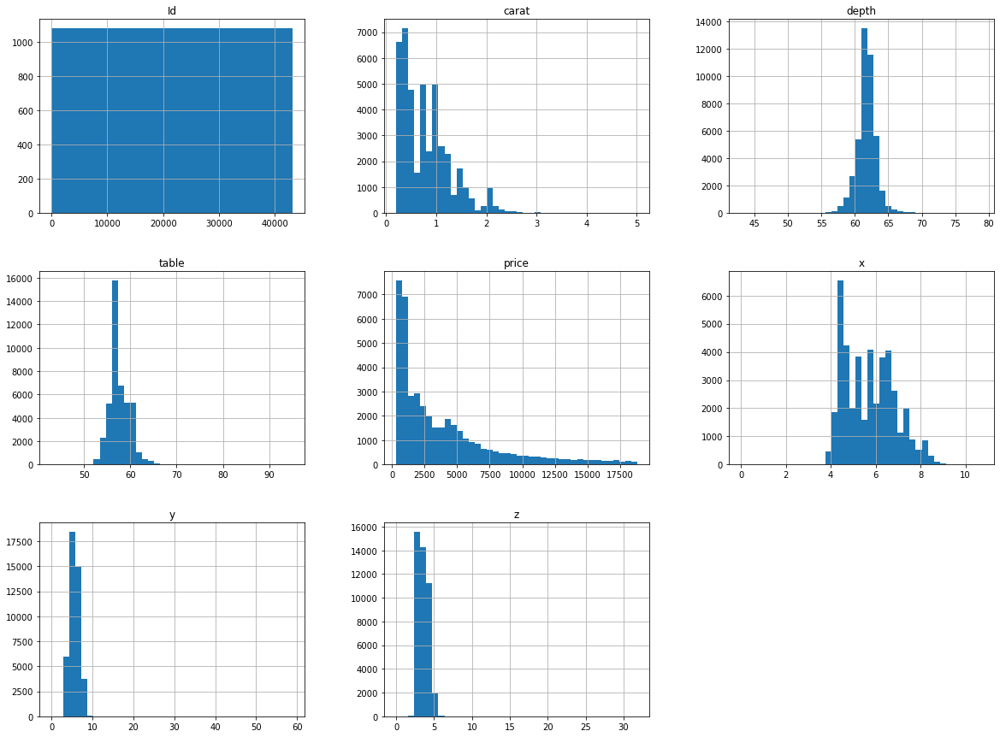

In [12]:
Data.hist(bins = 40, figsize = (20,15))
plt.show()

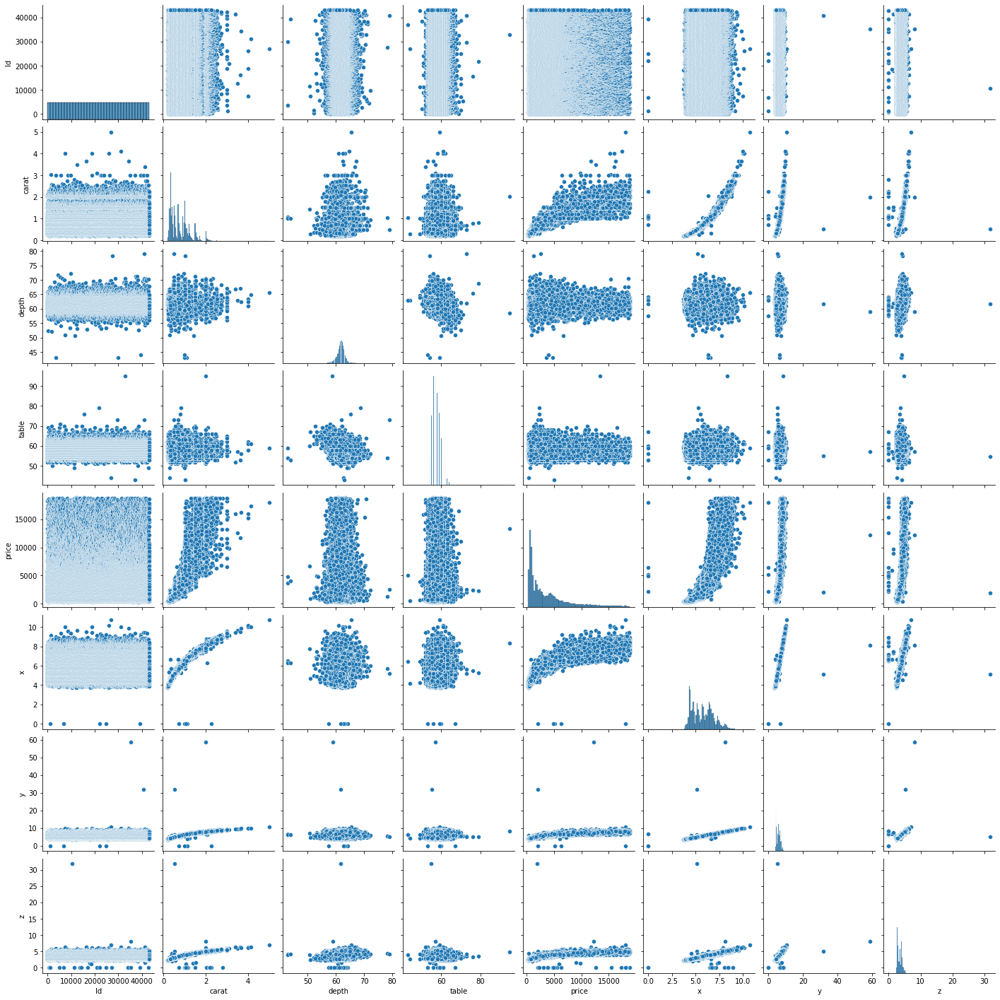

In [13]:
sns.pairplot(Data)

<AxesSubplot:xlabel='cut', ylabel='count'>

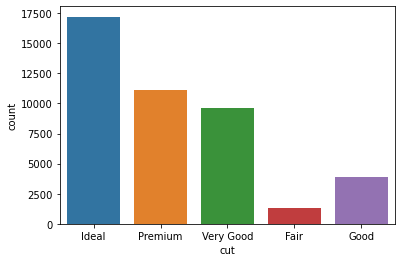

In [14]:
sns.countplot(data = Data ,x = 'cut')

<AxesSubplot:xlabel='cut', ylabel='price'>

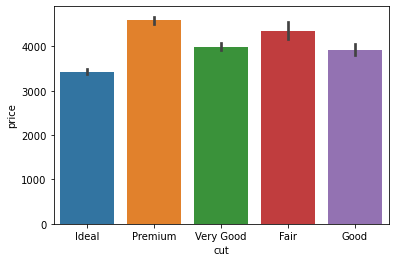

In [15]:
sns.barplot(data = Data, x ='cut', y='price')

<AxesSubplot:xlabel='color', ylabel='count'>

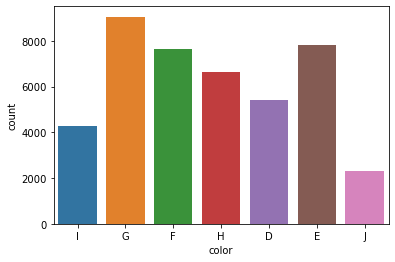

In [16]:
sns.countplot(data = Data,x = 'color')

<AxesSubplot:xlabel='color', ylabel='price'>

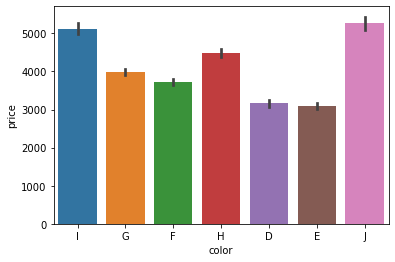

In [17]:
sns.barplot(data = Data, x ='color', y='price')

<AxesSubplot:xlabel='clarity', ylabel='count'>

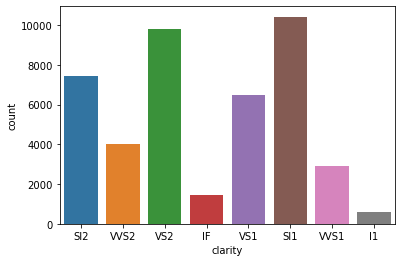

In [18]:
sns.countplot(data = Data,x = 'clarity')

<AxesSubplot:xlabel='clarity', ylabel='price'>

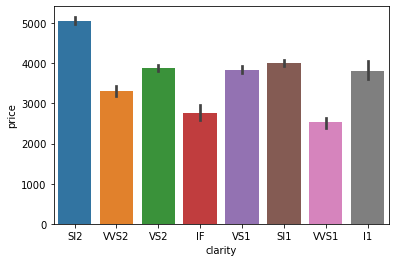

In [19]:
sns.barplot(data = Data, x ='clarity', y='price')

In [20]:
fig = px.box(Data, y='price', x='cut', width=600, height=400)
fig.show()

In [21]:
fig = px.box(Data, y='price', x='clarity', width=600, height=400)
fig.show()

In [22]:
fig = px.box(Data, y='price', x='color', width=600, height=400)
fig.show()

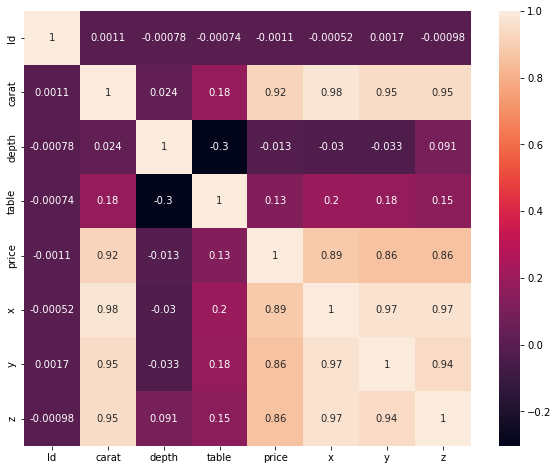

In [23]:
plt.subplots(figsize = (10, 8))
sns.heatmap(corr_matrix, annot = True)
plt.show()

C:\Users\hp\anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).



<AxesSubplot:xlabel='price', ylabel='Density'>

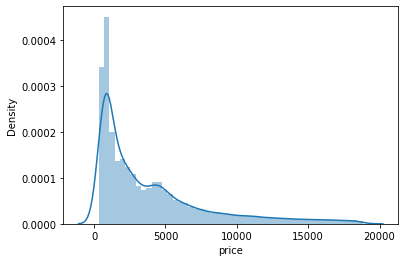

In [24]:
sns.distplot(Data.price)

In [25]:
Data.isna().sum()

Id         0
carat      0
cut        0
color      0
clarity    0
depth      0
table      0
price      0
x          0
y          0
z          0
dtype: int64

In [26]:
Data[['x','y','z']] = Data[['x','y','z']].replace(0,np.NaN)
Data.isna().sum()

Id          0
carat       0
cut         0
color       0
clarity     0
depth       0
table       0
price       0
x           5
y           4
z          17
dtype: int64

In [27]:
Data.dropna(inplace=True)
Data.isna().sum()

Id         0
carat      0
cut        0
color      0
clarity    0
depth      0
table      0
price      0
x          0
y          0
z          0
dtype: int64

In [28]:
Data.shape

(43135, 11)

**ML**

Using LabelEncoder to transform categorical values to integer values to feed to our models

In [29]:
encoder_label_cut = LabelEncoder()
encoder_label_color = LabelEncoder()
encoder_label_clarity = LabelEncoder()

Data['cut'] = encoder_label_cut.fit_transform(Data['cut'])
Data['color'] = encoder_label_color.fit_transform(Data['color'])
Data['clarity'] = encoder_label_clarity.fit_transform(Data['clarity'])

seperating the labels from the rest of the data

In [31]:
x = Data.drop(['price','Id'], axis=1)
y = Data['price']
X_train, X_test, y_train, y_test = train_test_split(x,y,test_size=0.2, random_state=42)
# sc = StandardScaler()
# x_train = sc.fit_transform(x_train)
# x_test = sc.transform(x_test)


making 3 arrays, to hold the model name, r2 score and the rmse.

In [32]:
R2_Scores = []
Rmse_score = []
models = ['Linear Regression', 'Lasso Regression', 'AdaBoost Regression', 'Ridge Regression', 'GradientBoosting Regression', 'RandomForest Regression', 'KNeighbours Regression']


Training Linear Regression model

In [33]:
LR_Model = LinearRegression()
LR_Model.fit(X_train , y_train)
accuracies = cross_val_score(estimator = LR_Model, X = X_train, y = y_train, cv = 5)
y_pred = LR_Model.predict(X_test)
print('####### Linear Regression #######')
print('Score : ', LR_Model.score(X_test, y_test))
print(accuracies)
rmse = mean_squared_error(y_test, y_pred, squared = False)
r2 = r2_score(y_test, y_pred)
print('')
print('RMSE   : %0.2f ' % rmse)
print('R2     : %0.2f ' % r2)
Rmse_score.append(rmse)
R2_Scores.append(r2)


####### Linear Regression #######
Score :  0.8878357079737266
[0.87905486 0.88667519 0.88296312 0.86002768 0.88368862]

RMSE   : 1345.38 
R2     : 0.89 


Training Lasso Regression model

In [34]:
LA_Model = Lasso()
LA_Model.fit(X_train , y_train)
accuracies = cross_val_score(estimator = LA_Model, X = X_train, y = y_train, cv = 5)
y_pred = LA_Model.predict(X_test)
print('###### Lasso Regression ######')
print('Score : %.4f' % LA_Model.score(X_test, y_test))
print(accuracies)
rmse = mean_squared_error(y_test, y_pred, squared = False)
r2 = r2_score(y_test, y_pred)
print('')
print('RMSE   : %0.2f ' % rmse)
print('R2     : %0.2f ' % r2)
Rmse_score.append(rmse)
R2_Scores.append(r2)


C:\Users\hp\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:530: ConvergenceWarning:

Objective did not converge. You might want to increase the number of iterations. Duality gap: 92384660.55744934, tolerance: 43317399.43176004

C:\Users\hp\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:530: ConvergenceWarning:

Objective did not converge. You might want to increase the number of iterations. Duality gap: 1902885198.2173004, tolerance: 43734679.31783174



###### Lasso Regression ######
Score : 0.8886
[0.88612554 0.88664436 0.88298883 0.87717669 0.88363755]

RMSE   : 1340.61 
R2     : 0.89 


Training AdaBoost Regression model

In [35]:
AB_Model = AdaBoostRegressor(n_estimators=1000)
AB_Model.fit(X_train , y_train)
accuracies = cross_val_score(estimator = AB_Model, X = X_train, y = y_train, cv = 5)
y_pred = AB_Model.predict(X_test)
print('###### AdaBoost Regression ######')
print('Score : %.4f' % AB_Model.score(X_test, y_test))
print(accuracies)
rmse = mean_squared_error(y_test, y_pred, squared = False)
r2 = r2_score(y_test, y_pred)
print('')
print('RMSE   : %0.2f ' % rmse)
print('R2     : %0.2f ' % r2)
Rmse_score.append(rmse)
R2_Scores.append(r2)


###### AdaBoost Regression ######
Score : 0.8841
[0.85893212 0.87550324 0.89577278 0.85241781 0.88277975]

RMSE   : 1367.36 
R2     : 0.88 


Training Ridge Regression model

In [36]:
RR_Model = Ridge()
RR_Model.fit(X_train , y_train)
accuracies = cross_val_score(estimator = RR_Model, X = X_train, y = y_train, cv = 5)
y_pred = RR_Model.predict(X_test)
print('###### Ridge Regression ######')
print('Score : %.4f' % RR_Model.score(X_test, y_test))
print(accuracies)
rmse = mean_squared_error(y_test, y_pred, squared = False)
r2 = r2_score(y_test, y_pred)
print('')
print('RMSE   : %0.2f ' % rmse)
print('R2     : %0.2f ' % r2)
Rmse_score.append(rmse)
R2_Scores.append(r2)


###### Ridge Regression ######
Score : 0.8879
[0.87962488 0.8866834  0.88298816 0.861592   0.88369072]

RMSE   : 1345.19 
R2     : 0.89 


Training GradientBoosting Regression model

In [37]:
GB_Model = GradientBoostingRegressor(n_estimators=100, learning_rate=0.1,max_depth=1, random_state=0,verbose = 1)
GB_Model.fit(X_train , y_train)
accuracies = cross_val_score(estimator = GB_Model, X = X_train, y = y_train, cv = 5)
y_pred = GB_Model.predict(X_test)
print('###### Gradient Boosting Regression #######')
print('Score : %.4f' % GB_Model.score(X_test, y_test))
print(accuracies)

rmse = mean_squared_error(y_test, y_pred, squared = False)
r2 = r2_score(y_test, y_pred)
print('')
print('RMSE   : %0.2f ' % rmse)
print('R2     : %0.2f ' % r2)
Rmse_score.append(rmse)
R2_Scores.append(r2)

      Iter       Train Loss   Remaining Time 
         1    13973682.5661            1.68s
         2    12399296.3211            1.61s
         3    11084379.9280            1.74s
         4     9912140.0804            1.60s
         5     8945678.2655            1.50s
         6     8074604.9462            1.43s
         7     7349157.8093            1.44s
         8     6720371.2938            1.44s
         9     6159473.1941            1.45s
        10     5691393.4431            1.40s
        20     3158836.9075            1.05s
        30     2347272.9430            0.84s
        40     2054177.3640            0.70s
        50     1879558.8277            0.57s
        60     1746915.8304            0.44s
        70     1646087.9754            0.33s
        80     1568244.4734            0.22s
        90     1507202.2136            0.11s
       100     1459287.9562            0.00s
      Iter       Train Loss   Remaining Time 
         1    13877258.7838            0.99s
        

Training RandomForest Regression model

In [38]:
RF_Model = RandomForestRegressor()
RF_Model.fit(X_train , y_train)
accuracies = cross_val_score(estimator = RF_Model, X = X_train, y = y_train, cv = 5)
y_pred = RF_Model.predict(X_test)
print('###### Random Forest ######')
print('Score : %.4f' % RF_Model.score(X_test, y_test))
print(accuracies)
rmse = mean_squared_error(y_test, y_pred, squared = False)
r2 = r2_score(y_test, y_pred)
print('')
print('RMSE   : %0.2f ' % rmse)
print('R2     : %0.2f ' % r2)
params_dict={'n_estimators':[100],
             'n_jobs':[-1],
             'max_features':["auto",'sqrt','log2']}
RF_Model=GridSearchCV(estimator=RandomForestRegressor(), param_grid=params_dict, scoring='r2')
RF_Model.fit(X_train,y_train)
print('Score : %.4f' % RF_Model.score(X_test, y_test))
pred = RF_Model.predict(X_test)
r2 = r2_score(y_test, pred)
print('R2 : %0.2f ' % r2)
Rmse_score.append(rmse)
R2_Scores.append(r2)



###### Random Forest ######
Score : 0.9812
[0.97623224 0.98066659 0.98051547 0.98001823 0.97898505]

RMSE   : 551.15 
R2     : 0.98 
Score : 0.9812
R2 : 0.98 


Training K Nearest Neighbors Regressor model

In [39]:
KNN_Model = KNeighborsRegressor()
KNN_Model.fit(X_train , y_train)
accuracies = cross_val_score(estimator = KNN_Model, X = X_train, y = y_train, cv = 5,verbose = 1)
y_pred = KNN_Model.predict(X_test)
print('###### KNeighbours Regression ######')
print('Score : %.4f' % KNN_Model.score(X_test, y_test))
print(accuracies)
rmse = mean_squared_error(y_test, y_pred, squared = False)
r2 = r2_score(y_test, y_pred)
print('')
print('RMSE   : %0.2f ' % rmse)
print('R2     : %0.2f ' % r2)
n_neighbors=[]
for i in range (1,101,10):     n_neighbors.append(i)
params_dict={'n_neighbors':n_neighbors, 'n_jobs':[-1]}
KNN_Model = GridSearchCV(estimator=KNeighborsRegressor(), param_grid=params_dict, scoring='r2')
KNN_Model.fit(X_train,y_train)
print('Score : %.4f' % KNN_Model.score(X_test, y_test))
pred = KNN_Model.predict(X_test)
r2 = r2_score(y_test, pred)
print('R2     : %0.2f ' % r2)
Rmse_score.append(rmse)
R2_Scores.append(r2)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    1.4s finished


###### KNeighbours Regression ######
Score : 0.9477
[0.94218821 0.93829302 0.94150381 0.9411277  0.94058532]

RMSE   : 918.34 
R2     : 0.95 
Score : 0.9470
R2     : 0.95 


Making a dataframe to better visualize our results

In [40]:
dataFrame = pd.DataFrame({'Algorithms' : models , 'R2-Scores' : R2_Scores, 'Rmse-Scores' : Rmse_score})
dataFrame.sort_values(by='R2-Scores' ,ascending=False)

,Algorithms,R2-Scores,Rmse-Scores
5,RandomForest Regression,0.981184,551.149462
6,KNeighbours Regression,0.947042,918.343304
4,GradientBoosting Regression,0.909565,1208.048217
1,Lasso Regression,0.888629,1340.610121
3,Ridge Regression,0.887867,1345.188220
0,Linear Regression,0.887836,1345.377201
2,AdaBoost Regression,0.884141,1367.355116


After choosing our best model, we will start transforming our test Data to suit our model

In [41]:
encoder = LabelEncoder()
Id = testData['Id']
testData = testData.drop('Id',axis=1)
testData['cut'] = encoder.fit_transform(testData['cut'])
testData['clarity'] = encoder.fit_transform(testData['clarity'])
testData['color'] = encoder.fit_transform(testData['color'])
testData.head()


,carat,cut,color,clarity,depth,table,x,y,z
0,0.34,2,3,7,61.1,57.0,4.52,4.48,2.75
1,0.71,3,1,5,62.7,58.0,5.74,5.68,3.58
2,0.44,4,5,4,62.8,56.0,4.83,4.88,3.05
3,0.81,3,1,3,60.1,59.0,6.09,6.03,3.65
4,0.40,2,3,6,61.2,56.0,4.74,4.80,2.92


Predicting our test Data

In [42]:
predictions = RF_Model.predict(testData)
data={'Id': Id, 'price':predictions }
results = pd.DataFrame(data)
results


,Id,price
0,1,935.31
1,2,2869.95
2,3,855.25
3,4,2804.52
4,5,1075.91
...,...,...
10783,10784,1716.19
10784,10785,6732.23
10785,10786,4309.00
10786,10787,4995.44
